In [1]:
import sys
sys.path.append("..")
import os 
os.environ['MPLCONFIGDIR'] = '/myhome'
# sys.path.append(os.path.abspath(os.path.join(os.path.dirname(__file__), os.path.pardir)))
from data import BavarianCrops, BreizhCrops, SustainbenchCrops, ModisCDL
from torch.utils.data import DataLoader
from earlyrnn import EarlyRNN
import torch
from tqdm import tqdm
from loss import EarlyRewardLoss
import sklearn.metrics
import pandas as pd
import wandb
from utils.plots import plot_label_distribution_datasets, boxplot_stopping_times, plot_spectral_bands
from utils.doy import get_doys_dict_test, get_doy_stop, create_sorted_doys_dict_test, get_approximated_doys_dict
from utils.helpers_training import parse_args, train_epoch
from utils.metrics import harmonic_mean_score
import matplotlib.pyplot as plt
from models.model_helpers import count_parameters
import seaborn as sns


PALETTE=sns.color_palette("colorblind")


In [2]:
data_path = os.path.join(os.environ.get("HOME", os.environ.get("USERPROFILE")),"elects_data")
dataset = "breizhcrops"
sequence_length = 150
dataroot = os.path.join(data_path,"breizhcrops")
nclasses = 9
input_dim = 13
print("get doys dict test")
doys_dict_test = get_doys_dict_test(dataroot=os.path.join(data_path,dataset))
length_sorted_doy_dict_test = create_sorted_doys_dict_test(doys_dict_test)
print("get doys dict test done")
print("get train and validation data...")
test_ds = BreizhCrops(root=dataroot,partition="eval", sequencelength=sequence_length, return_id=True)
class_names = test_ds.ds.classname
print("class names:", class_names)

get doys dict test
get doys dict test done
get train and validation data...
1555075632 1555075632


loading data into RAM: 100%|██████████| 122614/122614 [00:45<00:00, 2713.37it/s]

class names: ['barley' 'wheat' 'rapeseed' 'corn' 'sunflower' 'orchards' 'nuts'
 'permanent meadows' 'temporary meadows']


Sample 6032441 has label permanent meadows


(<Figure size 1500x700 with 1 Axes>, <Axes: xlabel='Day of year'>)

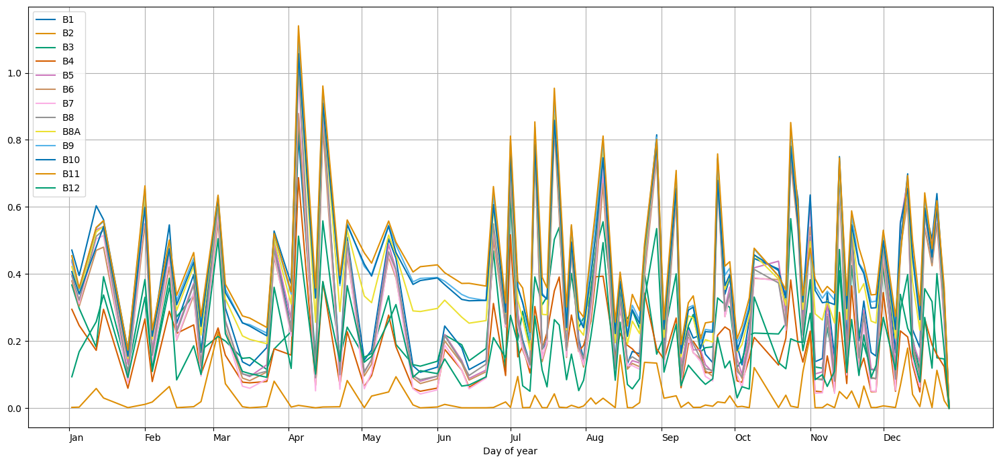

In [3]:
fig, ax = plt.subplots(figsize=(15,7))
idx = 11498
plot_spectral_bands(idx, test_ds, doys_dict_test, class_names, fig, ax)


Sample 6032238 has label corn


(<Figure size 1500x700 with 1 Axes>, <Axes: xlabel='Day of year'>)

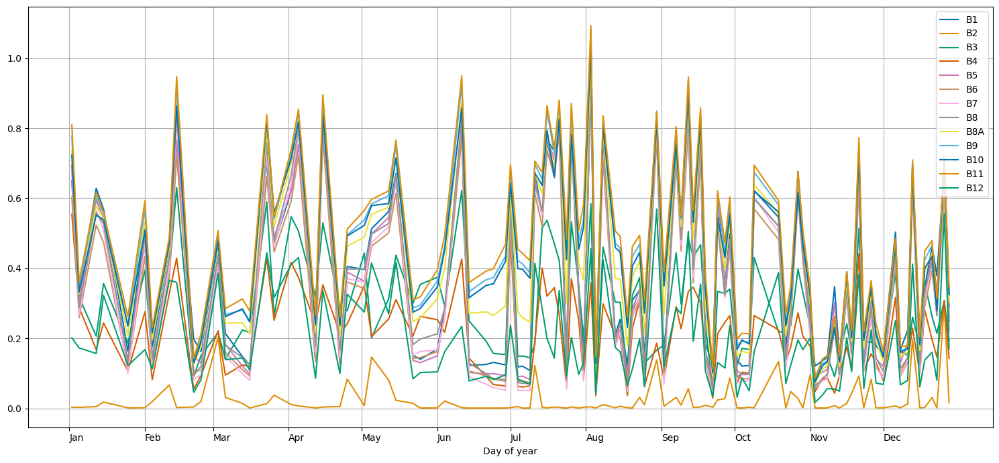

In [4]:
fig, ax = plt.subplots(figsize=(15,7))
idx = 11345
plot_spectral_bands(idx, test_ds, doys_dict_test, class_names, fig, ax)

## Count number of parcels per dataset

In [5]:
print("test_ds length:", len(test_ds))

test_ds length: 122614


In [6]:
train_ds = BreizhCrops(root=dataroot,partition="train", sequencelength=sequence_length, return_id=True)
print("train_ds length:", len(train_ds))

2559635960 2559635960


loading data into RAM: 100%|██████████| 178613/178613 [01:08<00:00, 2608.96it/s]


2253658856 2253658856


loading data into RAM: 100%|██████████| 140645/140645 [00:54<00:00, 2584.24it/s]

train_ds length: 319258


In [7]:
valid_ds = BreizhCrops(root=dataroot,partition="valid", sequencelength=sequence_length, return_id=True)
print("valid_ds length:", len(valid_ds))

2493572704 2493572704


loading data into RAM: 100%|██████████| 166391/166391 [01:06<00:00, 2505.76it/s]

valid_ds length: 166391


In [8]:
# sum of all the samples:
print("sum of all samples:", len(train_ds)+len(valid_ds)+len(test_ds))

sum of all samples: 608263


## Plot distribution of sequence length

In [9]:
dataroot = os.path.join(os.environ.get("HOME", os.environ.get("USERPROFILE")),"elects_data")
doys_dict = get_doys_dict_test(dataroot=dataroot)

In [10]:
# go through all the test samples and get the index
lengths = []
for _, _, idx in test_ds: 
    length = len(doys_dict[idx])
    lengths.append(length)

In [11]:
all_lengths = []
datasets_dict = {"test": test_ds, "train": train_ds, "valid": valid_ds}
for name, ds in datasets_dict.items():
    print(f"dataset: {name}")
    temp_lengths = []
    for X, _, idx in ds:
        # if the idx is not in the doys_dict, then the length is computed as the number of non zero elements in X
        if idx not in doys_dict:
            length = (X[:,0] != 0).sum().item()
        else:
            length = len(doys_dict[idx])
            computed_length = (X[:,0] != 0).sum().item()
            other_computed_length = (X[:,1] != 0).sum().item()
            # if length != computed_length:
            #     print(f"idx: {idx}, length: {length}, computed_length: {computed_length}")
            # if computed_length != other_computed_length:
            #     print(f"idx: {idx}, computed_length: {computed_length}, other_computed_length: {other_computed_length}")
            
        temp_lengths.append(length)
    all_lengths.append(temp_lengths)
    print(f"min: {min(temp_lengths)}, max: {max(temp_lengths)}, mean: {sum(temp_lengths)/len(temp_lengths)}")   

dataset: test
min: 49, max: 104, mean: 69.56733325721369
dataset: train
min: 50, max: 103, mean: 84.33494227239412
dataset: valid
min: 49, max: 103, mean: 85.86884506974536


Text(0.5, 1.0, 'Histogram of sequence lengths')

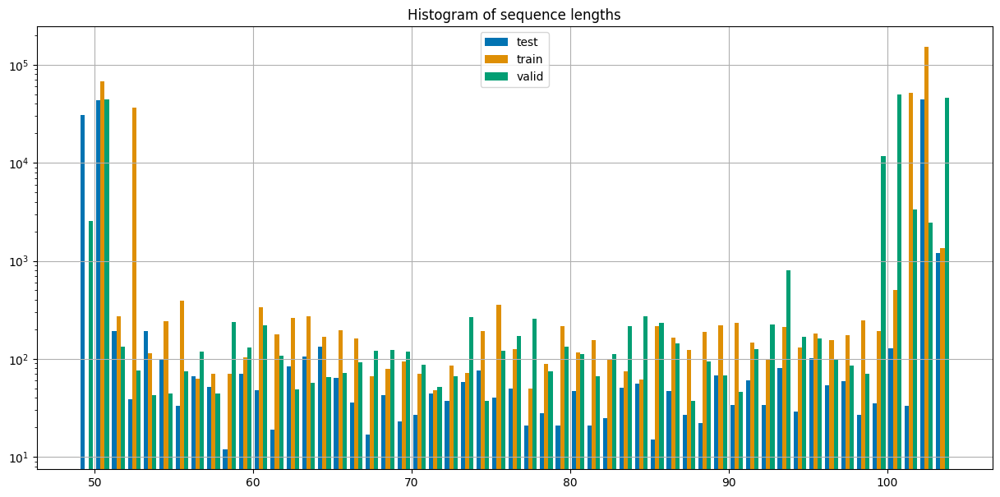

In [12]:
fig, ax = plt.subplots(figsize=(15,7))
ax.hist(all_lengths, bins=104-49, label=["test", "train", "valid"], histtype="bar", color=PALETTE[0:3], log=True)
ax.legend()
ax.grid()
ax.set_title("Histogram of sequence lengths")

According to Breizhcrops paper, L1C level data has either 51 or 102 length. 

If we look at the test set, two lengths can be observed: 
- number of non zero elements in the sequence,
- length given by the doys dictionary. 

They are unconsistent. That's why we trust the length in the csv files.

## Get the raw length 
Since we notice that the data lengths is not either 51 or 102, something is off. Let's load the raw length of the data.

In [13]:
all_data_path = os.path.join(data_path, "breizhcrops", "2017", "L1C")
files = ["frh0"+str(i)+".csv" for i in range(1, 5)]
dfs = []
for file in files:
    df = pd.read_csv(os.path.join(all_data_path, file))
    dfs.append(df)
df = pd.concat(dfs)

In [14]:
df.head()

,idx,id,CODE_CULTU,path,meanCLD,sequencelength,classid,classname,region
0,2,6017310,CZH,csv/frh01/6017310.csv,710.327555,50,2,rapeseed,frh01
1,3,6017311,BTH,csv/frh01/6017311.csv,717.753189,50,1,wheat,frh01
2,8,6021325,BTH,csv/frh01/6021325.csv,716.923683,50,1,wheat,frh01
3,12,6021396,PPH,csv/frh01/6021396.csv,716.800000,50,7,permanent meadows,frh01
4,14,6021404,ORP,csv/frh01/6021404.csv,736.644828,50,0,barley,frh01


C:\Users\anyam\AppData\Local\Temp\ipykernel_97708\1100029769.py:3: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.histplot(data=df, x="sequencelength", hue="region", bins=25, ax=ax, kde=True, palette=PALETTE, log_scale=True)


Text(0.5, 1.0, 'Histogram of sequence lengths for each dataset')

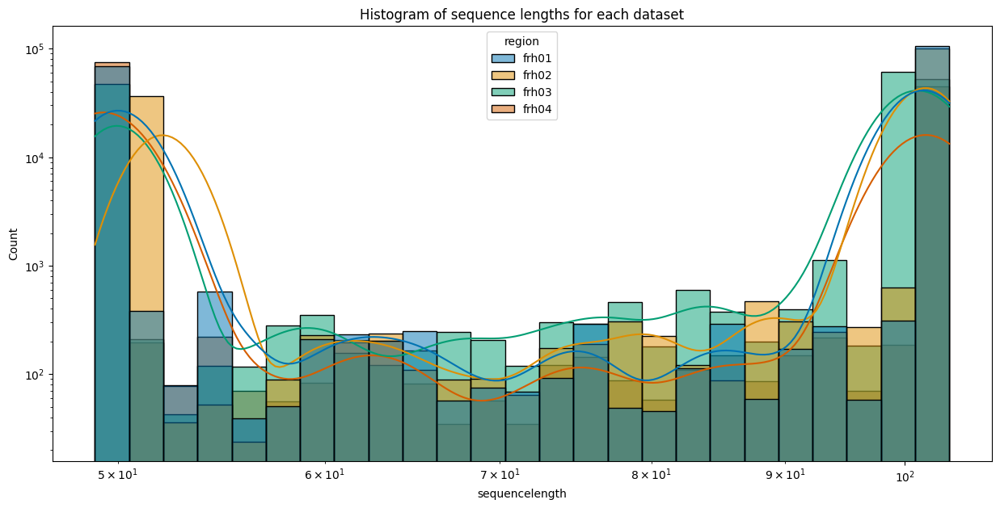

In [15]:
# plot the distribution of sequencelength of df, where the colors are determined by the filename
fig, ax = plt.subplots(figsize=(15,7))
sns.histplot(data=df, x="sequencelength", hue="region", bins=25, ax=ax, kde=True, palette=PALETTE, log_scale=True)
# set the y_axis to log scale
ax.set_yscale("log")
ax.set_title("Histogram of sequence lengths for each dataset")

In [16]:
# count the number of samples with 50<length<100 in the test set
print("number of samples with 50<length<100 in the test set:", df[df['region']=="frh04"]["sequencelength"].between(50,100).sum())
print("fraction of samples with 50<length<100 in the test set:", df[df['region']=="frh04"]["sequencelength"].between(50,100).sum()/len(df[df['region']=="frh04"]))

number of samples with 50<length<100 in the test set: 30927
fraction of samples with 50<length<100 in the test set: 0.25223057725871434


In [17]:
# count the number of samples with length==51 or  102 in the test set
print("number of samples with length==51 or 102 in the test set:", (df[df['region']=="frh04"]["sequencelength"]==51).sum()+(df[df['region']=="frh04"]["sequencelength"]==102).sum())
# count the fraction of samples with length==51, 102 in the test set
print("fraction of samples with length==51 or 102 in the test set:", ((df[df['region']=="frh04"]["sequencelength"]==51).sum()+(df[df['region']=="frh04"]["sequencelength"]==102).sum())/len(df[df['region']=="frh04"]))

number of samples with length==51 or 102 in the test set: 37045
fraction of samples with length==51 or 102 in the test set: 0.30212700017942484


region: frh01, sizes: [272, 67531, 110810]
region: frh02, sizes: [0, 85326, 55319]
region: frh03, sizes: [133, 2464, 163794]
region: frh04, sizes: [130, 36915, 85569]


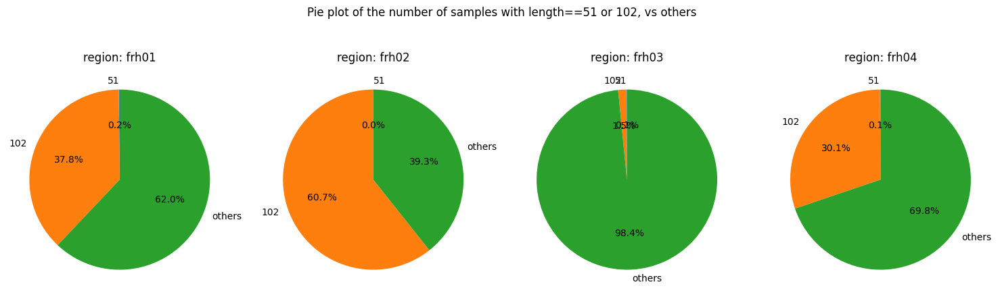

In [18]:
# create a pie plot for each region in df, where one slice of the pie represent the number of samples with length==51 or 102, vs others
fig, axes = plt.subplots(1, 4, figsize=(15,5))
for j, ax in enumerate(axes): 
    region = df["region"].unique()
    region = region[j]
    data = df[df["region"]==region]
    data = data["sequencelength"]
    labels = ["51", "102", "others"]
    sizes = [(data==51).sum(), (data==102).sum(), (~data.isin([51, 102])).sum()]
    print(f"region: {region}, sizes: {sizes}")
    ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
    ax.set_title(f"region: {region}")

fig.suptitle("Pie plot of the number of samples with length==51 or 102, vs others")
fig.tight_layout()


## Create datasets with lengths of 51 or 102
The datasets need to be reoganized to have a length of 51 or 102, such that they have enough samples. Indeed, region frh03 has less than 3000 samples after keeping only the samples with 51 or 102 length. From there, we organize as follows: 
- train: frh02
- valid: frh01
- test: frh03 + frh04

In [20]:
data_path = os.path.join(os.environ.get("HOME", os.environ.get("USERPROFILE")),"elects_data")
dataset = "breizhcrops"
sequence_length = 150
dataroot = os.path.join(data_path,"breizhcrops")
nclasses = 9
input_dim = 13

corrected = True
test_ds = BreizhCrops(root=dataroot,partition="eval", sequencelength=sequence_length, return_id=True, corrected=corrected)
train_ds = BreizhCrops(root=dataroot,partition="train", sequencelength=sequence_length, return_id=True, corrected=corrected)
valid_ds = BreizhCrops(root=dataroot,partition="valid", sequencelength=sequence_length, return_id=True, corrected=corrected)

class_names = valid_ds.ds.classname
dataroot = os.path.join(os.environ.get("HOME", os.environ.get("USERPROFILE")),"elects_data")
doys_dict = get_doys_dict_test(dataroot=dataroot)

2493572704 2493572704


loading data into RAM: 100%|██████████| 2597/2597 [00:01<00:00, 1705.44it/s]


1555075632 1555075632


loading data into RAM: 100%|██████████| 37045/37045 [00:17<00:00, 2167.50it/s]


2253658856 2253658856


loading data into RAM: 100%|██████████| 85326/85326 [00:38<00:00, 2200.98it/s]


2559635960 2559635960


loading data into RAM: 100%|██████████| 67803/67803 [00:30<00:00, 2247.80it/s]


In [21]:
all_lengths = []
datasets_dict = {"test": test_ds, "train": train_ds, "valid": valid_ds}
for name, ds in datasets_dict.items():
    print("_"*50)
    print(f"dataset: {name}")
    temp_lengths = []
    for X, _, idx in ds:
        length = (X[:,0] != 0).sum().item()
        temp_lengths.append(length)
    all_lengths.append(temp_lengths)
    print(f"min: {min(temp_lengths)}, max: {max(temp_lengths)}, mean: {sum(temp_lengths)/len(temp_lengths)}")
    print(f"unique lengths: {set(temp_lengths)}")  
    print(f"size: {len(temp_lengths)}") 

__________________________________________________
dataset: test
min: 51, max: 102, mean: 101.66164673830785
unique lengths: {51, 102}
size: 39642
__________________________________________________
dataset: train
min: 102, max: 102, mean: 102.0
unique lengths: {102}
size: 85326
__________________________________________________
dataset: valid
min: 51, max: 102, mean: 101.7954072828636
unique lengths: {51, 102}
size: 67803


Text(0.5, 1.0, 'Histogram of sequence lengths')

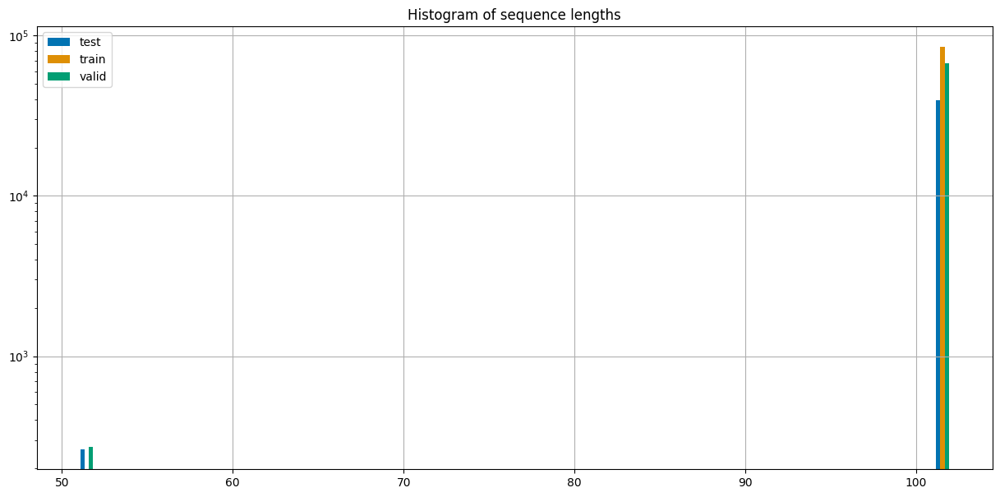

In [22]:
fig, ax = plt.subplots(figsize=(15,7))
ax.hist(all_lengths, bins=104-49, label=["test", "train", "valid"], histtype="bar", color=PALETTE[0:3], log=True)
ax.legend()
ax.grid()
ax.set_title("Histogram of sequence lengths")

datasets: [<data.breizhcrops.BreizhCrops object at 0x0000011BBD4E6490>, <data.breizhcrops.BreizhCrops object at 0x0000011BBD272710>, <data.breizhcrops.BreizhCrops object at 0x0000011B370CD550>]
sets_labels: ['test', 'train', 'valid']
Extracting labels from dataset test.
Extracting labels from dataset train.
Extracting labels from dataset valid.


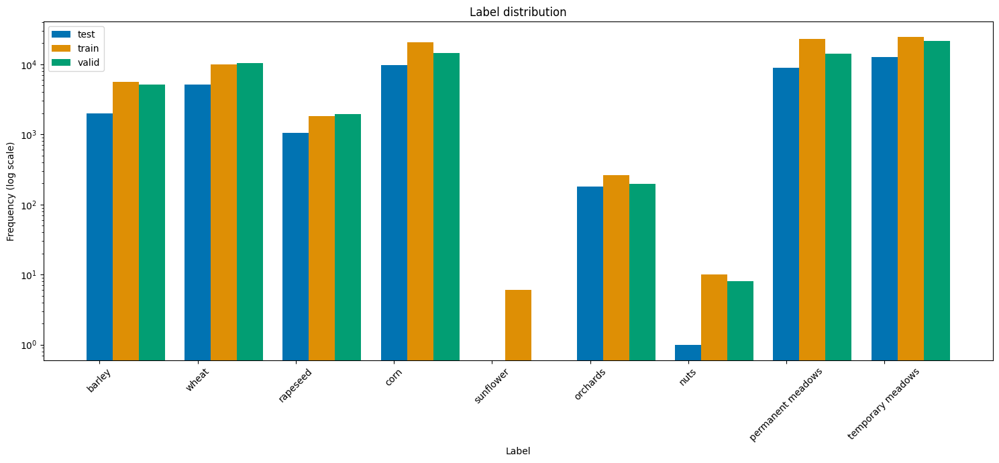

In [23]:
datasets = list(datasets_dict.values())
sets_labels = list(datasets_dict.keys())
print("datasets:", datasets)
print("sets_labels:", sets_labels)
fig, ax = plt.subplots(figsize=(15, 7))
fig, ax = plot_label_distribution_datasets(datasets, sets_labels, fig, ax, title='Label distribution', labels_names=class_names)

The new datasets with either 51 or 102 lengths have differents distributions of labels. For example, there are no or almost no parcels with labels sunflowers and nuts in the test and validations sets. 

Text(0, 0.5, 'Number of samples')

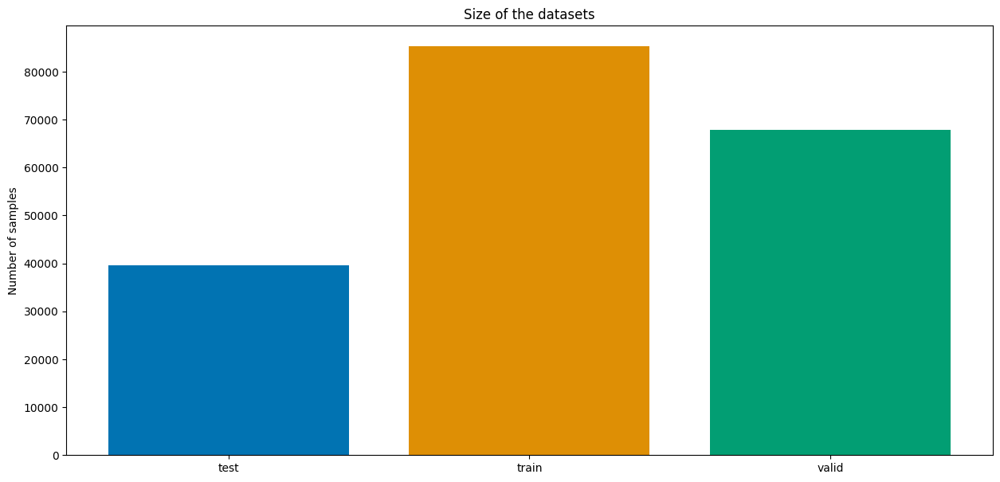

In [25]:
# compare the size of the datasets
fig, ax = plt.subplots(figsize=(15, 7))
ax.bar(sets_labels, [len(ds) for ds in datasets], color=PALETTE[0:3])
ax.set_title("Size of the datasets")
ax.set_ylabel("Number of samples")


## other try

In [49]:
from data.breizhcrops import BzhBreizhCrops
dataroot = os.path.join(data_path,"breizhcrops")
year=2017
test_l1c = BzhBreizhCrops("frh04", root=dataroot, transform=lambda x: x, preload_ram=True, year=year, level="L1C")

1555075632 1555075632


loading data into RAM: 100%|██████████| 122614/122614 [01:51<00:00, 1098.04it/s]


In [50]:
lengths_l1c = []
for iter, (X, _, idx) in enumerate(test_l1c):
    length = (X[:,0] != 0).sum().item()
    if iter%1000 == 0:
        print(f"iter: {iter}, X.shape: {X.shape}, length: {length}")
    lengths_l1c.append(length)

iter: 0, X.shape: (102, 17), length: 102
iter: 100, X.shape: (50, 17), length: 50
iter: 200, X.shape: (102, 17), length: 102
iter: 300, X.shape: (50, 17), length: 50
iter: 400, X.shape: (102, 17), length: 102
iter: 500, X.shape: (102, 17), length: 102
iter: 600, X.shape: (102, 17), length: 102
iter: 700, X.shape: (101, 17), length: 101
iter: 800, X.shape: (50, 17), length: 50
iter: 900, X.shape: (102, 17), length: 102
iter: 1000, X.shape: (49, 17), length: 49
iter: 1100, X.shape: (50, 17), length: 50
iter: 1200, X.shape: (102, 17), length: 102
iter: 1300, X.shape: (102, 17), length: 102
iter: 1400, X.shape: (102, 17), length: 102
iter: 1500, X.shape: (49, 17), length: 49
iter: 1600, X.shape: (49, 17), length: 49
iter: 1700, X.shape: (50, 17), length: 50
iter: 1800, X.shape: (50, 17), length: 50
iter: 1900, X.shape: (50, 17), length: 50
iter: 2000, X.shape: (102, 17), length: 102
iter: 2100, X.shape: (102, 17), length: 102
iter: 2200, X.shape: (102, 17), length: 102
iter: 2300, X.shape:

In [51]:
test_l2a = BzhBreizhCrops("frh04", root=dataroot, transform=lambda x: x, preload_ram=True, year=year, level="L2A")

639215848 639215848


loading data into RAM: 100%|██████████| 122708/122708 [01:24<00:00, 1445.94it/s]


In [52]:
lengths_l2a = []
for iter, (X, _, idx) in enumerate(test_l2a):
    length = (X[:,0] != 0).sum().item()
    if iter%1000 == 0:
        print(f"iter: {iter}, X.shape: {X.shape}, length: {length}")
    lengths_l2a.append(length)

iter: 0, X.shape: (23, 14), length: 23
iter: 1000, X.shape: (23, 14), length: 23
iter: 2000, X.shape: (25, 14), length: 25
iter: 3000, X.shape: (25, 14), length: 25
iter: 4000, X.shape: (39, 14), length: 39
iter: 5000, X.shape: (25, 14), length: 25
iter: 6000, X.shape: (27, 14), length: 27
iter: 7000, X.shape: (56, 14), length: 56
iter: 8000, X.shape: (39, 14), length: 39
iter: 9000, X.shape: (27, 14), length: 27
iter: 10000, X.shape: (25, 14), length: 25
iter: 11000, X.shape: (23, 14), length: 23
iter: 12000, X.shape: (56, 14), length: 56
iter: 13000, X.shape: (39, 14), length: 39
iter: 14000, X.shape: (27, 14), length: 27
iter: 15000, X.shape: (25, 14), length: 25
iter: 16000, X.shape: (23, 14), length: 23
iter: 17000, X.shape: (27, 14), length: 27
iter: 18000, X.shape: (60, 14), length: 60
iter: 19000, X.shape: (23, 14), length: 23
iter: 20000, X.shape: (27, 14), length: 27
iter: 21000, X.shape: (25, 14), length: 25
iter: 22000, X.shape: (23, 14), length: 23
iter: 23000, X.shape: (3

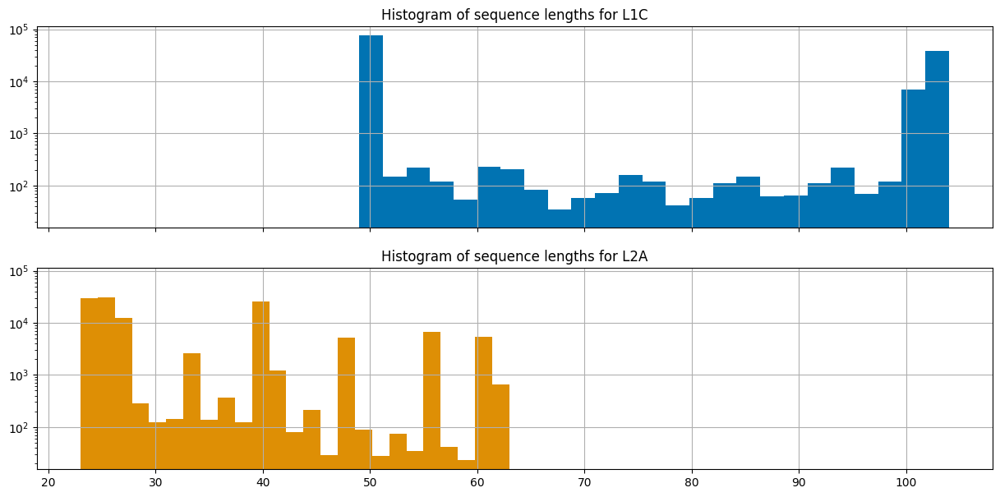

In [55]:
# two histogram, one for L1C and one for L2A lengths
fig, axes = plt.subplots(2, 1, figsize=(15,7), sharex=True, sharey=True)
axes[0].hist(lengths_l1c, bins=25, label="L1C", histtype="bar", color=PALETTE[0], log=True)
axes[1].hist(lengths_l2a, bins=25, label="L2A", histtype="bar", color=PALETTE[1], log=True)
axes[0].set_title("Histogram of sequence lengths for L1C")
axes[1].set_title("Histogram of sequence lengths for L2A")
axes[0].grid()
axes[1].grid()

In [48]:
test_l1c.year

2017

# Spectral signal with respect to the label and time

In [10]:
import datetime
doys_months = [datetime.datetime(2017,m,1).timetuple().tm_yday for m in range(1,13)]
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]


In [11]:
data = []

for X, y, idx in test_ds: 
    doys = doys_dict[idx]
    data.append({"idx": idx, "X": X, "y": y[0], "doys": doys})

In [12]:
df = pd.DataFrame(data)
df['X'] = df['X'].apply(lambda x: x.numpy()) 
df['y'] = df['y'].apply(lambda x: x.numpy())

In [13]:
df.head()
print("shape of X:", df['X'][0].shape)

shape of X: (150, 13)


In [14]:
import numpy as np

def get_mean_std_per_day(df: pd.DataFrame, label_y: int, band: int):
    df_label = df[df['y'] == label_y]
    max_doys_value = max([max(x) for x in df_label['doys']])
    mean_std_per_day = []
    for day in range(0, max_doys_value):
        # get a dataframe with all the samples that have the day in their doys and get the band of X instead of the whole X
        df_day = df_label[df_label['doys'].apply(lambda x: day in x)]
        if len(df_day) > 0:
            # get the band of the X
            X_day = df_day['X'].apply(lambda x: x[:,band]).values
            # get the indices of the day in the doys
            indices_day = df_day.doys.apply(lambda x: np.where(x==day)[0])
            # given the indices of the day (indices_day), compute the mean and std of X_day at those indices
            indices_day = np.concatenate(indices_day.values)
            band_at_day = [x[indices_day[i]] for i, x in enumerate(X_day)]
            mean = np.mean(band_at_day)
            std = np.std(band_at_day)
            mean_std_per_day.append({"day": day, "mean": mean, "std": std})
    return mean_std_per_day


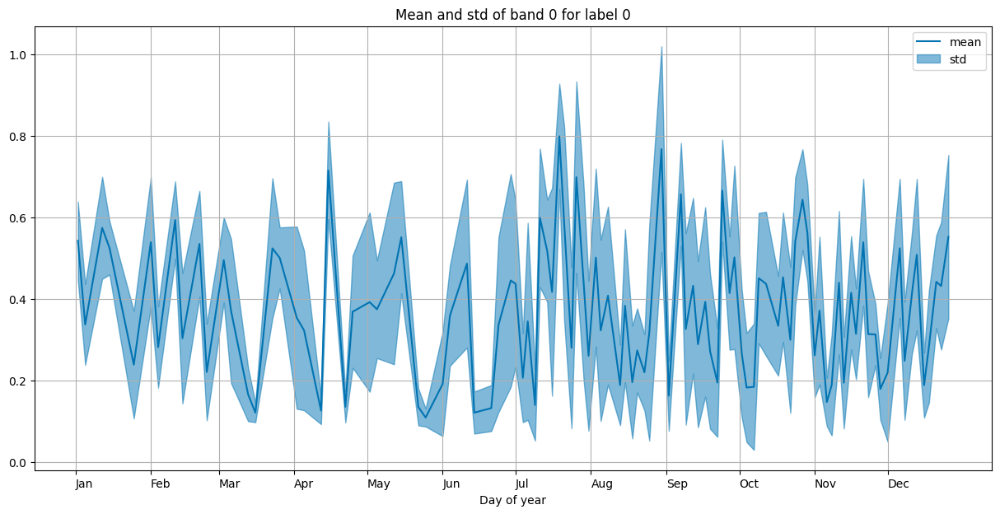

In [49]:
# from mean_std_per_day, plot the mean and std of the band for each day
def plot_mean_std_per_day(mean_std_per_day, label_y, band, fig, ax, label_string="", color=PALETTE[0], alpha=0.5, plot_std=True):
    ax.plot([x["day"] for x in mean_std_per_day], [x["mean"] for x in mean_std_per_day], label="mean"+label_string, color=color)
    if plot_std:
        ax.fill_between([x["day"] for x in mean_std_per_day], [x["mean"]-x["std"] for x in mean_std_per_day], [x["mean"]+x["std"] for x in mean_std_per_day], alpha=alpha, label="std"+label_string, color=color)
    ax.legend()
    ax.grid()
    ax.set_title(f"Mean and std of band {band} for label {label_y}")
    ax.set_xticks(doys_months)
    ax.set_xticklabels(months, ha="left")
    ax.set_xlabel("Day of year")
    return fig, ax 

fig, ax = plt.subplots(figsize=(15,7))
label_y = 0
band = 0
mean_std_per_day = get_mean_std_per_day(df, label_y, band)
fig, ax = plot_mean_std_per_day(mean_std_per_day, label_y, band, fig, ax)


Compute the mean and std of the spectral signal with respect to the label and time. Takes about 30 minutes to run.

In [20]:
data_mean_std_per_day = []  
SPECTRAL_BANDS = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B10', 'B11', 'B12',
               'QA10', 'QA20', 'QA60', 'doa']
filename = "mean_std_per_day.csv"
if os.path.exists(filename):
    df_data_mean_std_per_day = pd.read_csv(os.path.join(data_path,filename))
else: 
    for band in range(13):
        print(f"computing for band: {band} ({SPECTRAL_BANDS[band]})")
        for label_y, class_name in enumerate(class_names):
            print(f"computing for label: {label_y} (class: {class_name})")
            mean_std_per_day = get_mean_std_per_day(df, label_y, band)
            data_mean_std_per_day.append({"label": label_y, "class_name": class_name, "band": SPECTRAL_BANDS[band], "mean_std_per_day": mean_std_per_day})
        print("-"*50)
    df_mean_std_per_day = pd.DataFrame(data_mean_std_per_day)
    df_mean_std_per_day.to_csv(os.path.join(data_path,filename), index=False)

computing for band: 0 (B1)
computing for label: 0 (class: barley)
computing for label: 1 (class: wheat)
computing for label: 2 (class: rapeseed)
computing for label: 3 (class: corn)
computing for label: 4 (class: sunflower)
computing for label: 5 (class: orchards)
computing for label: 6 (class: nuts)
computing for label: 7 (class: permanent meadows)
computing for label: 8 (class: temporary meadows)
--------------------------------------------------
computing for band: 1 (B2)
computing for label: 0 (class: barley)
computing for label: 1 (class: wheat)
computing for label: 2 (class: rapeseed)
computing for label: 3 (class: corn)
computing for label: 4 (class: sunflower)
computing for label: 5 (class: orchards)
computing for label: 6 (class: nuts)
computing for label: 7 (class: permanent meadows)
computing for label: 8 (class: temporary meadows)
--------------------------------------------------
computing for band: 2 (B3)
computing for label: 0 (class: barley)
computing for label: 1 (clas

In [24]:
df_mean_std_per_day.head()

,label,class_name,band,mean_std_per_day
0,0,barley,B1,"[{'day': 2, 'mean': 0.54342866, 'std': 0.09594..."
1,1,wheat,B1,"[{'day': 2, 'mean': 0.5490006, 'std': 0.095614..."
2,2,rapeseed,B1,"[{'day': 2, 'mean': 0.55808455, 'std': 0.09456..."
3,3,corn,B1,"[{'day': 2, 'mean': 0.53623575, 'std': 0.09625..."
4,4,sunflower,B1,"[{'day': 2, 'mean': 0.36569846, 'std': 0.00300..."


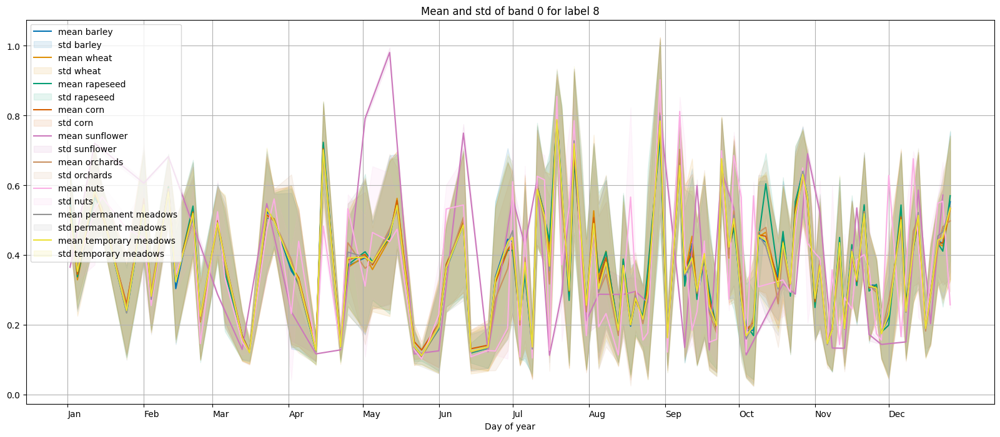

In [19]:
fig, ax = plt.subplots(figsize=(20,8))

for label_y, class_name in enumerate(class_names):
    mean_std_per_day = df_mean_std_per_day[df_mean_std_per_day['label'] == label_y].iloc[0]['mean_std_per_day']
    fig, ax = plot_mean_std_per_day(mean_std_per_day, label_y, band, fig, ax, label_string=f" {class_name}", color=PALETTE[label_y], alpha=0.1)

class_name: barley, label_y: 0
class_name: wheat, label_y: 1
class_name: rapeseed, label_y: 2
class_name: corn, label_y: 3
class_name: sunflower, label_y: 4
class_name: orchards, label_y: 5
class_name: nuts, label_y: 6
class_name: permanent meadows, label_y: 7
class_name: temporary meadows, label_y: 8


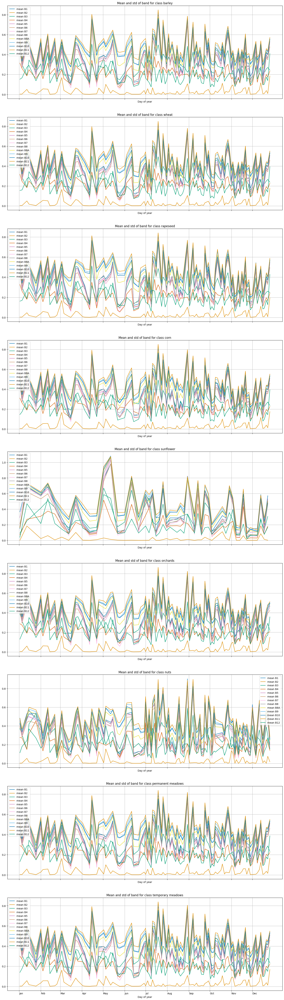

In [50]:
fig, axes = plt.subplots(len(class_names), 1, figsize=(20, 8*len(class_names)), sharex=True)
palette = sns.color_palette("colorblind", 13)
for class_name, ax in zip(class_names, axes):
    # find the label_y corresponding to the class_name
    label_y = df_mean_std_per_day[df_mean_std_per_day['class_name'] == class_name].iloc[0]['label']
    for band in range(13):
        mean_std_per_day = df_mean_std_per_day[(df_mean_std_per_day['class_name'] == class_name) & (df_mean_std_per_day['band'] == SPECTRAL_BANDS[band])].iloc[0]['mean_std_per_day']
        fig, ax = plot_mean_std_per_day(mean_std_per_day, label_y, band, fig, ax, label_string=f" {SPECTRAL_BANDS[band]}", color=palette[band], alpha=0.1, plot_std=False)
        ax.set_title(f"Mean and std of band for class {class_name}")

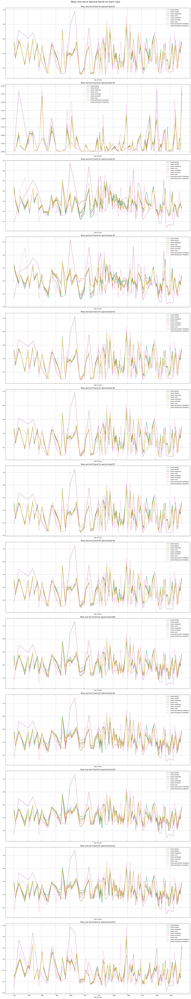

In [51]:
fig, axes = plt.subplots(13, 1, figsize=(20, 8*13), sharex=True)
palette = sns.color_palette("colorblind", 13)
for band in range(13):
    ax = axes[band]
    for label_y, class_name in enumerate(class_names):
        mean_std_per_day = df_mean_std_per_day[(df_mean_std_per_day['class_name'] == class_name) & (df_mean_std_per_day['band'] == SPECTRAL_BANDS[band])].iloc[0]['mean_std_per_day']
        fig, ax = plot_mean_std_per_day(mean_std_per_day, label_y, band, fig, ax, label_string=f" {class_name}", color=palette[label_y], alpha=0.1, plot_std=False)
        ax.set_title(f"Mean and std of band for spectral band {SPECTRAL_BANDS[band]}")

fig.suptitle("Mean and std of spectral bands for each class", fontsize=16, y=1.)
fig.tight_layout()

In [52]:
import plotly.express as px



In [99]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

def plotly_mean_std_per_day(mean_std_per_day, band, class_name, color='blue'):
    # Create traces for mean and std
    mean_trace = go.Scatter(
        x=[x["day"] for x in mean_std_per_day],
        y=[x["mean"] for x in mean_std_per_day],
        mode='lines',
        name=f'{band} - {class_name} mean',
        line=dict(color=color)
    )

    std_upper = [x["mean"]+x["std"] for x in mean_std_per_day]
    std_lower = [x["mean"]-x["std"] for x in mean_std_per_day]
    std_lower = std_lower[::-1]  # reverse for correct fill
    
    # Properly construct the RGBA string
    if color.startswith('rgb') and not color.startswith('rgba'):  # for 'rgb' colors, convert to 'rgba' with the specified opacity
        fillcolor = color.replace('rgb', 'rgba').replace(')', ', 0.2)')
    elif color.startswith('rgba'):  # for 'rgba' colors, just use them as they are
        # replace the last value (opacity) with 0.2
        fillcolor = color[:color.rfind(',')] + ', 0.2)'
    else:  # for named CSS colors (like 'blue'), you'll need to define their RGBA equivalent or convert them
        fillcolor = 'rgba(0, 0, 255, 0.2)'  # example for 'blue'

    std_trace = go.Scatter(
        x=[x["day"] for x in mean_std_per_day] + [x["day"] for x in mean_std_per_day][::-1],
        y=std_upper + std_lower,
        fill='toself',
        fillcolor=fillcolor,
        line=dict(color='rgba(255,255,255,0)'),
        name=f'{band} - {class_name} std',
    )

    return mean_trace, std_trace


In [100]:

# Assume df_mean_std_per_day is defined, and we have the day, mean, and std data ready.

# Define the spectral band and class we are focusing on
band_of_interest = SPECTRAL_BANDS[0]
class_of_interest = class_names[0]
mean_std_per_day = df_mean_std_per_day[(df_mean_std_per_day['class_name'] == class_of_interest) & (df_mean_std_per_day['band'] == band_of_interest)]['mean_std_per_day'][0]
# Define the color for the plot (you can use a color from your palette)
color_for_plot = 'rgba(0, 0, 255, 1)'  # This is equivalent to 'blue' with full opacity

# Create subplots: one row, one column
fig = make_subplots(rows=1, cols=1)

# Get the traces and add them to the subplot
mean_trace, std_trace = plotly_mean_std_per_day(mean_std_per_day, band_of_interest, class_of_interest, color=color_for_plot)
fig.add_trace(mean_trace, row=1, col=1)
fig.add_trace(std_trace, row=1, col=1)

# Update layout if needed
fig.update_layout(
    title=f'Mean and std of spectral band {band_of_interest} for class {class_of_interest}',
    xaxis_title='Day of year',
    yaxis_title='Value'
)

# Show the figure
fig.show()


In [107]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Example of color palette for class names, with enough colors for all classes
class_color_palette = [
    'rgba(31, 119, 180, 1)', 'rgba(255, 127, 14, 1)', 'rgba(44, 160, 44, 1)',
    'rgba(214, 39, 40, 1)', 'rgba(148, 103, 189, 1)', 'rgba(140, 86, 75, 1)',
    'rgba(227, 119, 194, 1)', 'rgba(127, 127, 127, 1)', 'rgba(188, 189, 34, 1)',
    # ... add more colors if you have more classes
]

def plot_all_bands_classes(df_mean_std_per_day, spectral_bands, class_names):
    # Create a subplot with one row for each band
    fig = make_subplots(rows=len(spectral_bands), cols=1, shared_xaxes=True, vertical_spacing=0.02)

    # Loop over each band
    for band_index, band in enumerate(spectral_bands):
        # Loop over each class name
        for class_index, class_name in enumerate(class_names):
            mean_std_per_day = df_mean_std_per_day[(df_mean_std_per_day['class_name'] == class_name) & (df_mean_std_per_day['band'] == band)]['mean_std_per_day'].tolist()
            if len(mean_std_per_day) == 1:
                mean_std_per_day = mean_std_per_day[0]

            if len(mean_std_per_day) > 0:
                # Call the plotting function for each class
                mean_trace, std_trace = plotly_mean_std_per_day(mean_std_per_day, band, class_name, color=class_color_palette[class_index])

                # Add traces to the subplot for the current band
                fig.add_trace(mean_trace, row=band_index + 1, col=1)
                fig.add_trace(std_trace, row=band_index + 1, col=1)

    doys_months = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]  # Example Day of Year values for each month start
    months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    # Apply tickvals and ticktext to all x-axes
    for i in range(1, len(spectral_bands) + 1):
        fig.update_xaxes(
            tickvals=doys_months,
            ticktext=months,
            tickangle=-45,
            title_text='Day of Year' if i == len(spectral_bands) else "",  # Only add title to the last plot
            row=i, col=1
        )

    # Update layout if needed
    fig.update_layout(
        height=300*len(spectral_bands),  # Adjust height based on the number of bands
        title='Mean and std of spectral bands for all classes',
        yaxis_title='Value',
        showlegend=True
    )


    # Set y-axis titles for all subplots
    for band_index, band in enumerate(spectral_bands):
        fig.update_yaxes(title_text=f'Band {band}', row=band_index + 1, col=1)
    
    # Show the figure
    fig.show()

# Usage:
# Assuming 'df_mean_std_per_day' is your DataFrame with all the data,
# 'SPECTRAL_BANDS' is your list of bands, and 'class_names' is your list of classes.
plot_all_bands_classes(df_mean_std_per_day, SPECTRAL_BANDS, class_names)
